# CYCLING DATA QUALITY

## (03b) Feature Matching

## Why?

The feature matching takes it starting point in the reference data and attempts to identify corresponding features in the OSM data set. Feature matching is a necessary precondition in order to compare single features rather than feature characteristics on study area a grid cell level, as well as for merging two data sets.

## How?

Matching features in two road datasets with each their way of digitizing features and a potential one-to-many relationship between edges (for example in the case where one data set only maps road center lines, while the other map the geometries of each bike lane) is not a trivial task.

The method used here converts all network edges to smaller segments of a uniform length before looking for a potential match between the reference and the OSM data. The matching is done on the basis of the buffered distance between objects, the angle, and the undirected Hausdorff distance, and is based on the work of [Koukoletsos et al. (2012)](http://www.geog.leeds.ac.uk/groups/geocomp/2011/papers/koukoletsos.pdf) and [Will (2014)](https://www.semanticscholar.org/paper/Development-of-an-automated-matching-algorithm-to-%3A-Will/b3b77d579077b967820630db56522bef31654f21).

Based on the matching results we compute:
- The number and length of matched and unmatched edges, in total and per grid cell
- A comparison of the attributes of the matched edges (is their classification of cycling infrastructure as protected or unprotected the same?)

## What could it mean?

One the feature matching is complete, it is important to visually explore the results, since the success rate of the matching influences how the analysis of number of matches should be interpreted.

If the features in the two data sets have been digitized in very differnet ways - e.g. if one data set has digitised bike tracks as mostly straight lines, while the other includes more winding tracks, the matching will fail. This is also the case if they are placed too far from each other. If we visually can confirm that the same features do exist in both data sets, a lack of matches indicates that the geometries in the two data sets are too different. If we on the other hand can confirm that most real corresponding features have been identified, a lack of matches in an area indicates errors of commission or omission.

*The feature matching is faily computationally expensive and will take a while to compute. For the testing data provided in this repository (with around 8000 meters of OSM network) the cell takes around 20 minutes to run.*

**Sections:**

1. Feature matching
    - Plot results: matched vs. unmatched features
2. Analyse results
    - Matched features by infrastructure type
    - Matched features per grid cell
3. Summary
4. Save results

_______________

In [10]:
import json
import numbers
import os.path
import pickle

import contextily as cx
import folium
import geopandas as gpd
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import osmnx as ox
import yaml

from src import evaluation_functions as ef
from src import matching_functions as mf
from src import plotting_functions as pf

# Read in dictionaries with settings
%run ../settings/yaml_variables.py
%run ../settings/plotdict.py
%run ../settings/tiledict.py

# # Load data
%run ../settings/load_osmdata.py
%run ../settings/load_refdata.py

# Combine grid geodataframes
grid = osm_grid.merge(ref_grid)
assert len(grid) == len(osm_grid) == len(ref_grid)

OSM graphs loaded successfully!
OSM data loaded successfully!
Reference graphs loaded successfully!
Reference data loaded successfully!


__________________

## 1. Feature Matching

<div class="alert alert-block alert-info">
<b>User configurations</b>
<br>
<br>
In the feature matching, the user must indicate:
<ul>
    <li>the segment length (length of the segments in meters that all features are split into before the matching) (<span style="font-family: monospace">segment_length</span>) </li>
    <li>the buffer distance used to find potential matches (i.e. the max distance between two segments that could represent the same object) (<span style="font-family: monospace">buffer_dist</span>) </li>
    <li>the maximum Hausdorff distance between features that can be considered matches (in this context it refers to the maximum distance between two geometries. For example, a segment A with a length of 25 meters might be within a 10 meter buffer distance of segment B, but if they are perpendicular to each other, the Hausdorff distance will be greater than 10 meters). (<span style="font-family: monospace">hausdorff_threshold</span>)</li>
    <li>the angular threshold between segments before they are no longer considered a potential match. (<span style="font-family: monospace">angular_threshold</span>) </li>
</ul>
</div>

In [11]:
# DEFINE FEATURE MATCHING USER SETTINGS
segment_length = 10  # The shorter the segments, the longer the matching process will take. For cities with a gridded street network with streets as straight lines, longer segments will usually work fine
buffer_dist = 15
hausdorff_threshold = 17
angular_threshold = 30

for s in [segment_length, buffer_dist, hausdorff_threshold, angular_threshold]:
    assert isinstance(s, int) or isinstance(s, float), print(
        "Settings must be integer or float values!"
    )

In [5]:
osm_segments = mf.create_segment_gdf(
    osm_edges_simplified, segment_length=segment_length
)
osm_segments.rename(columns={"osmid": "org_osmid"}, inplace=True)
osm_segments["osmid"] = osm_segments[
    "edge_id"
]  # Because matching function assumes an id column names osmid as unique id for edges
osm_segments.set_crs(study_crs, inplace=True)
osm_segments.dropna(subset=["geometry"], inplace=True)

ref_segments = mf.create_segment_gdf(
    ref_edges_simplified, segment_length=segment_length
)
ref_segments.set_crs(study_crs, inplace=True)
ref_segments.rename(columns={"seg_id": "seg_id_ref"}, inplace=True)
ref_segments.dropna(subset=["geometry"], inplace=True)

print("Segments created successfully!")

matches_fp = f"../../results/compare/{study_area}/segment_matches_{buffer_dist}_{hausdorff_threshold}_{angular_threshold}.pickle"
if os.path.exists(matches_fp):
    with open(matches_fp, "rb") as fp:
        segment_matches = pickle.load(fp)
    print("Loaded existing segment matches...")

else:
    print("Starting feature matching...")

    buffer_matches = mf.overlay_buffer(
        reference_data=ref_segments,
        osm_data=osm_segments,
        ref_id_col="seg_id_ref",
        osm_id_col="seg_id",
        dist=buffer_dist,
    )

    print("Buffer matches found! Continuing with final matching process...")

    segment_matches = mf.find_matches_from_buffer(
        buffer_matches=buffer_matches,
        osm_edges=osm_segments,
        reference_data=ref_segments,
        angular_threshold=angular_threshold,
        hausdorff_threshold=hausdorff_threshold,
    )

    print("Feature matching completed!")

    with open(matches_fp, "wb") as f:
        pickle.dump(segment_matches, f)

Segments created!
Starting feature matching...
Buffer matches found!
60959 reference segments were matched to OSM edges
2736 reference segments were not matched
Feature matching completed!


FileNotFoundError: [Errno 2] No such file or directory: '../results/segment_matches_cph_geodk.pickle'

In [9]:
# Summarize feature matching results

osm_matched_ids, osm_undec = mf.summarize_feature_matches(
    osm_segments, segment_matches, "seg_id", "osmid", osm=True
)

ref_matched_ids, ref_undec = mf.summarize_feature_matches(
    ref_segments, segment_matches, "seg_id_ref", "edge_id", osm=False
)

### Plot feature matching results

In [12]:
# Folium plot of segment matches

osm_edges_simplified_folium = pf.make_edgefeaturegroup(
    gdf=osm_edges_simplified,
    mycolor=pdict["osm_seg"],
    myweight=pdict["osm_weight"],
    nametag="OSM all edges",
    show_edges=True,
    myalpha=pdict["osm_alpha"],
)

ref_edges_simplified_folium = pf.make_edgefeaturegroup(
    gdf=ref_edges_simplified,
    mycolor=pdict["ref_seg"],
    myweight=pdict["ref_weight"],
    nametag="Reference all edges",
    show_edges=True,
    myalpha=pdict["ref_alpha"],
)

segment_matches_folium = pf.make_edgefeaturegroup(
    gdf=segment_matches,
    mycolor=pdict["mat_seg"],
    myweight=pdict["mat_weight"],
    nametag="Segment matches",
    show_edges=True,
    myalpha=pdict["mat_alpha"],
)

m = pf.make_foliumplot(
    feature_groups=[
        osm_edges_simplified_folium,
        ref_edges_simplified_folium,
        segment_matches_folium,
    ],
    layers_dict=folium_layers,
    center_gdf=osm_nodes_simplified,
    center_crs=osm_nodes_simplified.crs,
)

m.save(f"../../results/compare/{study_area}/folium_segment_matches.html")

display(m)

### Plot matched and unmatched features in OSM and reference data sets

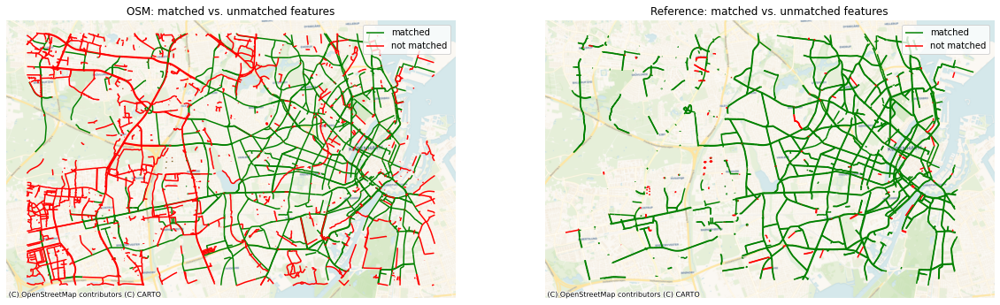

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# OSM
i = 0
osm_edges_simplified.loc[osm_edges_simplified.edge_id.isin(osm_matched_ids)].plot(
    ax=ax[i], color=pdict["match"], label="matched"
)
osm_edges_simplified.loc[~osm_edges_simplified.edge_id.isin(osm_matched_ids)].plot(
    ax=ax[i], color=pdict["nomatch"], label="not matched"
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("OSM: matched vs. unmatched features")
ax[i].set_axis_off()
ax[i].legend()

# REF
i = 1
ref_edges_simplified.loc[ref_edges_simplified.edge_id.isin(ref_matched_ids)].plot(
    ax=ax[i], color=pdict["match"], label="matched"
)
ref_edges_simplified.loc[~ref_edges_simplified.edge_id.isin(ref_matched_ids)].plot(
    ax=ax[i], color=pdict["nomatch"], label="not matched"
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("Reference: matched vs. unmatched features")
ax[i].set_axis_off()
ax[i].legend();

### Summarize results

In [14]:
count_matched_osm = len(
    osm_edges_simplified.loc[osm_edges_simplified.edge_id.isin(osm_matched_ids)]
)
count_matched_ref = len(
    ref_edges_simplified.loc[ref_edges_simplified.edge_id.isin(ref_matched_ids)]
)

print(
    f"Out of {len(osm_edges_simplified)} OSM edges, {count_matched_osm} were matched with a reference edge."
)
print(
    f"Out of {len(ref_edges_simplified)} reference edges, {count_matched_ref} were matched with an OSM edge."
)

length_matched_osm = osm_edges_simplified.loc[
    osm_edges_simplified.edge_id.isin(osm_matched_ids)
].geometry.length.sum()
length_unmatched_osm = osm_edges_simplified.loc[
    ~osm_edges_simplified.edge_id.isin(osm_matched_ids)
].geometry.length.sum()

length_matched_ref = ref_edges_simplified.loc[
    ref_edges_simplified.edge_id.isin(ref_matched_ids)
].geometry.length.sum()
length_unmatched_ref = ref_edges_simplified.loc[
    ~ref_edges_simplified.edge_id.isin(ref_matched_ids)
].geometry.length.sum()

print(
    f"Out of {osm_edges_simplified.geometry.length.sum()/1000:.2f} km of OSM edges, {length_matched_osm/1000:.2f} km were matched with a reference edge."
)
print(
    f"Out of {ref_edges_simplified.geometry.length.sum()/1000:.2f} km of reference edges, {length_matched_ref/1000:.2f} km were matched with an OSM edge."
)

# TODO: Compute pct

results_feature_matching = {
    "osm_matched_count": count_matched_osm,
    "ref_matched_count": count_matched_ref,
    "osm_matched_length": length_matched_osm,
    "ref_matched_length": length_matched_ref,
}

Out of 5666 OSM edges, 2567 were matched with a reference edge.
Out of 4705 reference edges, 4309 were matched with an OSM edge.
Out of 810.36 km of OSM edges, 421.17 km were matched with a reference edge.
Out of 626.48 km of reference edges, 602.29 km were matched with an OSM edge.


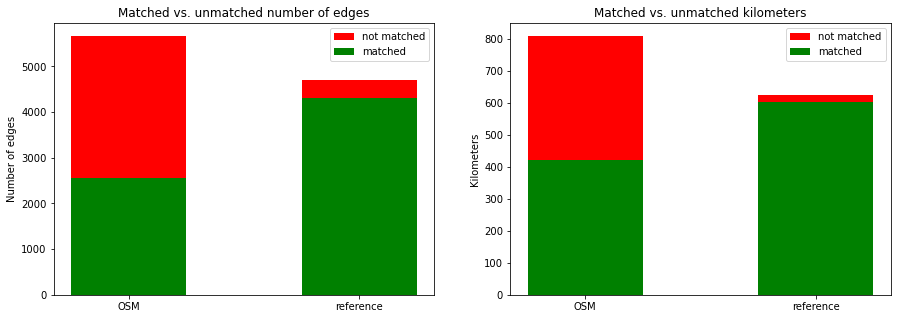

In [15]:
# PLOT MATCHING SUMMARY

fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=False)
bars = ("OSM", "reference")
y_pos = [0.5, 1.5]

# Edges
i = 0
ax[i].bar(
    y_pos[0],
    [len(osm_edges_simplified)],
    width=pdict["bar_single"],
    color=pdict["nomatch"],
    label="not matched",
)
ax[i].bar(
    y_pos[0],
    [count_matched_osm],
    width=pdict["bar_single"],
    color=pdict["match"],
    label="matched",
)

ax[i].bar(
    y_pos[1],
    [len(ref_edges_simplified)],
    width=pdict["bar_single"],
    color=pdict["nomatch"],
)
ax[i].bar(
    y_pos[1], [count_matched_ref], width=pdict["bar_single"], color=pdict["match"]
)

ax[i].set_title("Matched vs. unmatched number of edges")
ax[i].set_xticks(y_pos, bars)
ax[i].set_ylabel("Number of edges")
ax[i].legend()

# Kilometers
i = 1
ax[i].bar(
    y_pos[0],
    [osm_edges_simplified.geometry.length.sum() / 1000],
    width=pdict["bar_single"],
    color=pdict["nomatch"],
    label="not matched",
)
ax[i].bar(
    y_pos[0],
    [length_matched_osm / 1000],
    width=pdict["bar_single"],
    color=pdict["match"],
    label="matched",
)

ax[i].bar(
    y_pos[1],
    [ref_edges_simplified.geometry.length.sum() / 1000],
    width=pdict["bar_single"],
    color=pdict["nomatch"],
)
ax[i].bar(
    y_pos[1],
    [length_matched_ref / 1000],
    width=pdict["bar_single"],
    color=pdict["match"],
)

ax[i].set_title("Matched vs. unmatched kilometers")
ax[i].set_xticks(y_pos, bars)
ax[i].set_ylabel("Kilometers")

ax[i].legend();

________________

## 2. Analyse feature matching results

### Compare infrastructure type in matched features

In [16]:
updated_osm = mf.update_osm(
    osm_segments,
    osm_edges_simplified,
    segment_matches,
    "protected",
    "edge_id",
    "seg_id",
)

# TODO: Get count of aggreement and save to results dict

#### Plotting edges marked as *protected* infrastructure in both datasets / edges with differing classifications

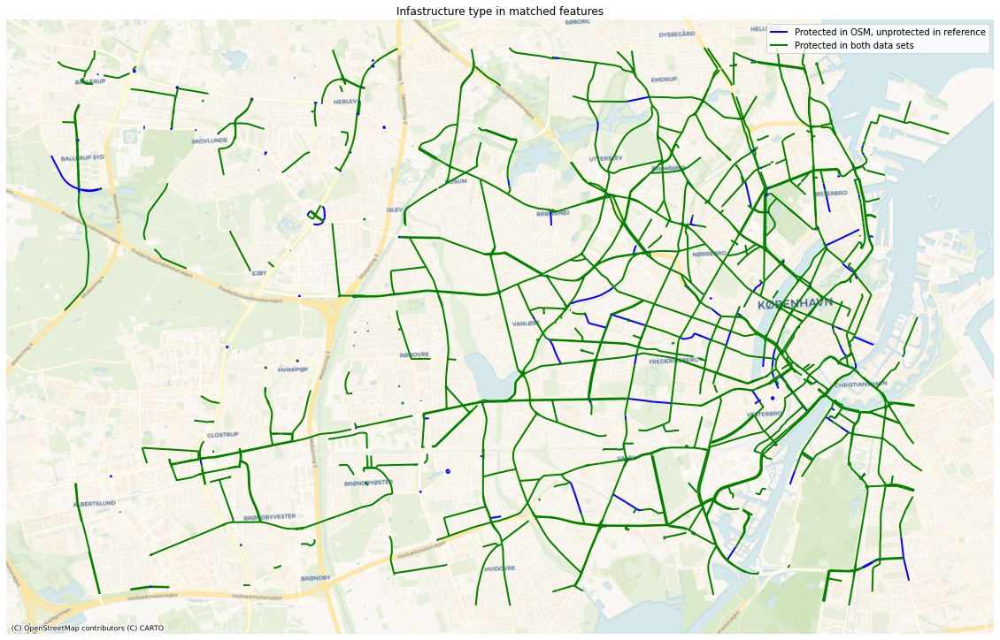

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

updated_osm.loc[updated_osm.protected != updated_osm.protected_matched].plot(
    ax=ax, color="blue", linewidth=2, label="Protected in OSM, unprotected in reference"
)
updated_osm.loc[updated_osm.protected == updated_osm.protected_matched].plot(
    ax=ax, color="green", linewidth=2, label="Protected in both data sets"
)
cx.add_basemap(ax=ax, crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax.set_title("Infastructure type in matched features")
ax.legend()
ax.set_axis_off()

#### Count and measure length of matched and unmatched features per grid cell

In the plots below, the count, pct and length of matched and unmatched features in each dataset are summmarized. It should be noted that the number of matched features in one dataset in a grid cell does not necessarily reflect the number of matched features in the other dataset, since an edge can be matched to a corresponding edge in another cell. Moreover, the local count refers to edges intersected with the grid cell. For example, a long bikelane crossing 3 cells will thus be counted as matched in 3 different cells.
This does not change the relative distribution of matched/unmatched features, but it does entail that the overall summary of matched/unmatched features above uses a different total count of edges than the plots below.

In [25]:
osm_matched = osm_edges_simp_joined.loc[
    osm_edges_simp_joined.edge_id.isin(osm_matched_ids)
]

osm_unmatched = osm_edges_simp_joined.loc[
    ~osm_edges_simp_joined.edge_id.isin(osm_matched_ids)
]

# Count features in each grid cell
all_data_osm = [osm_matched, osm_unmatched]
labels_osm = ["osm_matched", "osm_unmatched"]

for data, label in zip(all_data_osm, labels_osm):

    df = ef.count_features_in_grid(data, label)

    grid = ef.merge_results(grid, df, "left")

    df = ef.length_of_features_in_grid(data, label)

    grid = ef.merge_results(grid, df, "left")


ref_matched = ref_edges_simp_joined.loc[
    ref_edges_simp_joined.edge_id.isin(ref_matched_ids)
]
ref_unmatched = ref_edges_simp_joined.loc[
    ~ref_edges_simp_joined.edge_id.isin(ref_matched_ids)
]

# Count and compute length of features in each grid cell
all_data_ref = [ref_matched, ref_unmatched]
labels_ref = ["ref_matched", "ref_unmatched"]

for data, label in zip(all_data_ref, labels_ref):

    df = ef.count_features_in_grid(data, label)

    grid = ef.merge_results(grid, df, "left")

    df = ef.length_of_features_in_grid(data, label)

    grid = ef.merge_results(grid, df, "left")

# Compute pct matched/unmatched
grid["pct_matched_osm"] = (
    grid["count_osm_matched"] / grid["count_osm_simplified_edges"] * 100
)
grid["pct_matched_ref"] = (
    grid["count_ref_matched"] / grid["count_ref_simplified_edges"] * 100
)
grid["pct_unmatched_osm"] = (
    grid["count_osm_unmatched"] / grid["count_osm_simplified_edges"] * 100
)
grid["pct_unmatched_ref"] = (
    grid["count_ref_unmatched"] / grid["count_ref_simplified_edges"] * 100
)

grid.loc[grid.loc[grid.pct_matched_osm == 100].index, "pct_unmatched_osm"] = 0
grid.loc[grid.loc[grid.pct_matched_ref == 100].index, "pct_unmatched_ref"] = 0

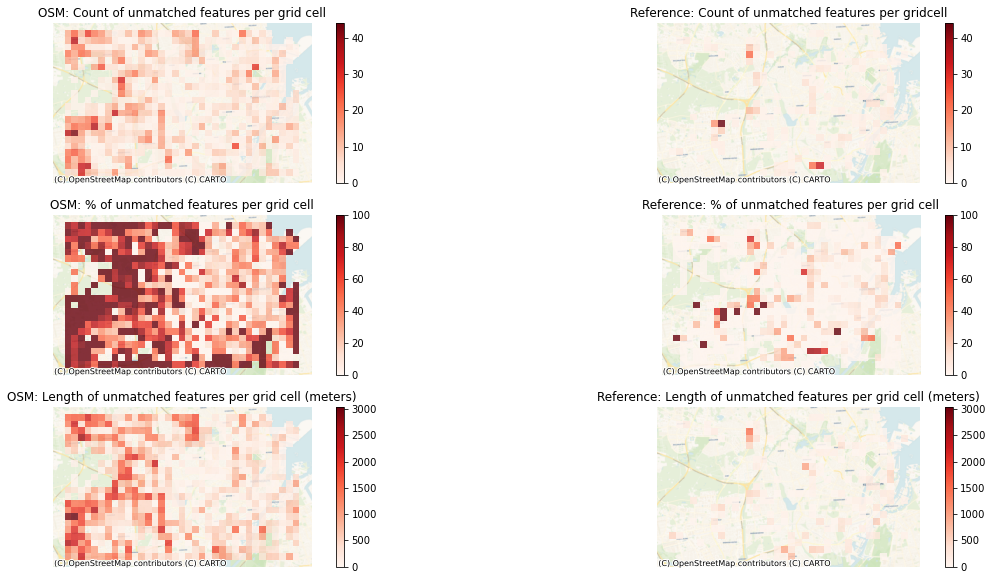

In [26]:
# Plot of unmatched features

matchnorm = colors.Normalize(
    vmin=0, vmax=grid[["count_osm_unmatched", "count_ref_unmatched"]].max().max()
)
pctnorm = colors.Normalize(vmin=0, vmax=100)
lengthnorm = colors.Normalize(
    vmin=0, vmax=grid[["length_osm_unmatched", "length_ref_unmatched"]].max().max()
)

fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 10))

ax = ax.flatten()

i = 0
grid.plot(
    ax=ax[i],
    column="count_osm_unmatched",
    legend=True,
    alpha=pdict["alpha_grid"],
    cmap=pdict["miss"],
    norm=matchnorm,
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("OSM: Count of unmatched features per grid cell")
ax[i].set_axis_off()

i = 1
grid.plot(
    ax=ax[i],
    column="count_ref_unmatched",
    legend=True,
    alpha=pdict["alpha_grid"],
    cmap=pdict["miss"],
    norm=matchnorm,
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("Reference: Count of unmatched features per gridcell")
ax[i].set_axis_off()

i = 2
grid.plot(
    ax=ax[i],
    column="pct_unmatched_osm",
    legend=True,
    alpha=pdict["alpha_grid"],
    cmap=pdict["miss"],
    norm=pctnorm,
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("OSM: % of unmatched features per grid cell")
ax[i].set_axis_off()

i = 3
grid.plot(
    ax=ax[i],
    column="pct_unmatched_ref",
    legend=True,
    alpha=pdict["alpha_grid"],
    cmap=pdict["miss"],
    norm=pctnorm,
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("Reference: % of unmatched features per grid cell")
ax[i].set_axis_off()

i = 4
grid.plot(
    ax=ax[i],
    column="length_osm_unmatched",
    legend=True,
    alpha=pdict["alpha_grid"],
    cmap=pdict["miss"],
    norm=lengthnorm,
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("OSM: Length of unmatched features per grid cell (meters)")
ax[i].set_axis_off()

i = 5
grid.plot(
    ax=ax[i],
    column="length_ref_unmatched",
    legend=True,
    alpha=pdict["alpha_grid"],
    cmap=pdict["miss"],
    norm=lengthnorm,
)
cx.add_basemap(ax=ax[i], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[i].set_title("Reference: Length of unmatched features per grid cell (meters)")
ax[i].set_axis_off();

___________________

## 3. Summary

In [ ]:
# total matched and unmatched in each dataset - count, length, percent count, percent length
# count+percent matched agreement on protected/unprotected

# Local max min?

____________________

## 4. Save results

In [27]:
with open(f"../../results/compare/{study_area}/feature_matches_.json", "w") as outfile:
    json.dump(results_feature_matching, outfile)

with open(
    f"../../results/compare/{study_area}/grid_results_feature_matching_{buffer_dist}_{hausdorff_threshold}_{angular_threshold}.pickle",
    "wb",
) as f:
    pickle.dump(grid, f)